# Create maps

Using IVT catchment and ambulance trust shapefiles, create maps - for example, population weighted mean IMD score per IVT catchment, or mean transfer time by ambulance trust.

Notes:
* When using the 2018 age CSV file, there were two Welsh hospital catchments (CF311RQ Bridgend, CF144XW Cardiff) that each contained two LSOAs that are not present in that age file (Rhondda Cynon Taf 023F, Rhondda Cynon Taf 027F, Rhondda Cynon Taf 027G, Rhondda Cynon Taf 023G). Since we use the population count from this age csv file to calculate a weighted sum for the IVT catchment, these LSOAs were previously (1) excluded from the weighted mean, and (2) excluded from the map. However, in the 2020 age CSV file now used, these areas have data, so **these steps are no longer required and have been removed**.
* To help with geopandas use https://github.com/MichaelAllen1966/2010_geopandas/blob/main/geopandas_1.ipynb
* Uses MatPlotLib for mapping the data since that gives us more power than the GeoPandas DataFrame plot method.

## 1 Set up

### 1.1 Import libraries and define file paths

In [1]:
import contextily as ctx
from dataclasses import dataclass
import geopandas as gpd
from mapclassify import greedy
import matplotlib.pyplot as plt
from matplotlib.transforms import Bbox
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import numpy as np
import os
import pandas as pd
from pandas.api.types import is_numeric_dtype

# Linting
%load_ext pycodestyle_magic
%pycodestyle_on

In [2]:
# Define file paths
@dataclass(frozen=True)
class Paths:
    '''Singleton object for storing paths to data and database.'''

    data = './data'
    collated = 'collated_data_amb.csv'

    hospitals = 'hospitals'
    stroke_hospitals = 'stroke_hospitals_2022.csv'

    shapefiles = 'shapefiles'
    ivt_catchment = 'ivt_catchment.shp'
    amb_catchment = 'amb_catchment.shp'
    countries = 'Countries_(December_2022)_GB_BFC.zip'


paths = Paths()

### 1.2 Load data

We convert data to epsg:3857, as that is needed when using base maps. Base maps are a reference map that you can then overlay your data onto - for example, a topographic basemap showing elevation. We can set the crs (Coordinate Reference System) when loading a GeoPandas DataFrame. CRS to consider:
* EPSG:27700 -- BNG (British National Grid Eastings and Northings).
* EPSG:27700 OSGB 1936 / British National Grid -- United Kingdom Ordnance Survey. Co-ordinates are in Eastings (X) and Northings (Y).
* EPSG:4326 WGS 84 -- WGS84 - World Geodetic System 1984. Co-ordinates are in Longitude (X) and Latitude (Y).
* EPSG:3857 - projection for displaying lat/long as a flat map

**IVT catchment shapefile** - shape file of the catchments for the IVT units in England and Wales, which we load into a GeoPandas DataFrame. Note that we can set the crs (Coordinate Reference System) when loading a GeoPandas DataFrame. EPSG:27700 is the crs to use when geography is in BNG (British National Grid Eastings and Northings). Note: If this fails to run, you need to run `02_create_ivt_catchment_shapefile.ipynb` to generate the IVT catchment shapefile.

,LSOA11CD,LSOA11NM,LSOA11NMW,geometry
closest_iv,,,,
B152TH,E01008881,Birmingham 067A,Birmingham 067A,"MULTIPOLYGON (((403011.723 266679.152, 402597...."
B714HJ,E01008899,Birmingham 037A,Birmingham 037A,"MULTIPOLYGON (((395950.714 272162.470, 395950...."


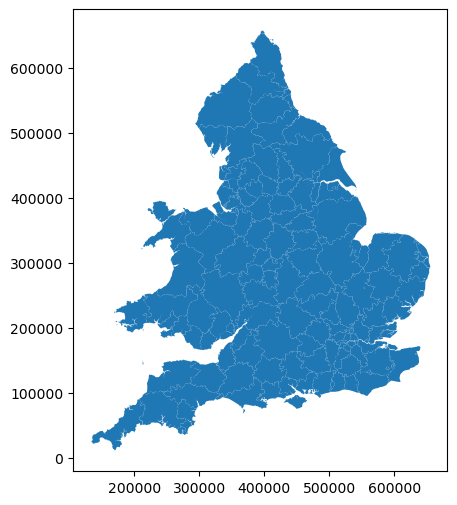

In [3]:
# Load IVT catchment shapefile
gdf_ivt_catchment = gpd.read_file(
    os.path.join(paths.data, paths.shapefiles, paths.ivt_catchment),
    crs='EPSG:27700')

# Set index
gdf_ivt_catchment.set_index(['closest_iv'], inplace=True)

# Preview the dataframe
display(gdf_ivt_catchment.head(2))

# Plot the shapefile
gdf_ivt_catchment.plot(figsize=(6, 6))
plt.show()

# Convert crs to epsg 3857
gdf_ivt_catchment = gdf_ivt_catchment.to_crs(epsg=3857)

**Country outline** - used to produce outline of countries on the map.

,FID,CTRY22CD,CTRY22NM,CTRY22NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,SHAPE_Leng,SHAPE_Area,geometry
0,1,E92000001,England,Lloegr,394883,370883,-2.07811,53.23497,{096C3540-B006-4D2D-BCDF-B3E945B80D51},1.358939e+07,1.304623e+11,"MULTIPOLYGON (((-712384.210 6422975.926, -7123..."
2,3,W92000004,Wales,Cymru,263405,242881,-3.99417,52.06741,{1DFA050A-C94B-4E58-8210-DE8274C7C33E},3.273688e+06,2.078260e+10,"MULTIPOLYGON (((-347425.136 6688819.680, -3474..."


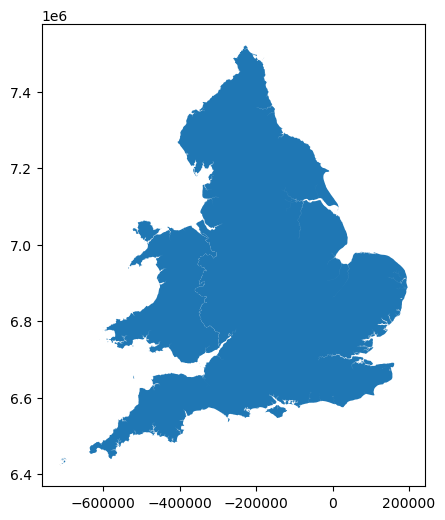

In [4]:
# Load country outline
outline = gpd.read_file(os.path.join(
    paths.data, paths.shapefiles, paths.countries))

# Drop Scotland
mask = outline['CTRY22NM'] != 'Scotland'
outline = outline[mask]

# Convert to epsg:3857
outline = outline.to_crs(epsg=3857)

# Preview the dataframe
display(outline.head())

# Plot the shapefile
outline.plot(figsize=(6, 6))
plt.show()

**LSOA information** - load `collated_data.csv` produced by `01_combine_demographic_data.ipynb` which has information on each LSOA.

In [5]:
df_lsoa = pd.read_csv(os.path.join(paths.data, paths.collated))
df_lsoa.head(2)

,LSOA,admissions,closest_ivt_unit,closest_ivt_unit_time,closest_mt_unit,closest_mt_unit_time,closest_mt_transfer,closest_mt_transfer_time,total_mt_time,ivt_rate,...,age_band_males_65,age_band_males_70,age_band_males_75,age_band_males_80,age_band_males_85,age_band_males_90,ambulance_service,local_authority_district_22,LAD22NM,country
0,Welwyn Hatfield 010F,0.666667,SG14AB,18.7,NW12BU,36.9,CB20QQ,39.1,57.8,6.8,...,33,28,26,14,5,3,East of England,Welwyn Hatfield,Welwyn Hatfield,England
1,Welwyn Hatfield 012A,4.000000,SG14AB,19.8,NW12BU,36.9,CB20QQ,39.1,58.9,6.8,...,24,18,21,12,5,4,East of England,Welwyn Hatfield,Welwyn Hatfield,England


**Hospital data** - load data on each hospital, with aim of getting locations of hospitals that provide IVT.

In [6]:
# Read in data on each hospital
gdf_units = gpd.read_file(
    os.path.join(paths.data, paths.hospitals, paths.stroke_hospitals))

# Combine get geometry from Easting and Northing columns
gdf_units["geometry"] = gpd.points_from_xy(
        gdf_units.Easting, gdf_units.Northing)
gdf_units = gdf_units.set_crs(epsg=27700)

# Restrict to the units delivering thrombolysis
mask = gdf_units['Use_IVT'] == '1'
gdf_units = gdf_units[mask]

# Preview dataframe
gdf_units.head(2)

# Convert crs to epsg 3857
gdf_units = gdf_units.to_crs(epsg=3857)

**Ambulance catchment shapefile**

,LSOA11CD,LSOA11NM,LSOA11NMW,geometry
ambulance_,,,,
East Midlands,E01013128,North East Lincolnshire 010A,North East Lincolnshire 010A,"MULTIPOLYGON (((433631.972 296489.554, 433631...."
East of England,E01015589,Peterborough 004A,Peterborough 004A,"MULTIPOLYGON (((503939.688 193345.500, 503939...."


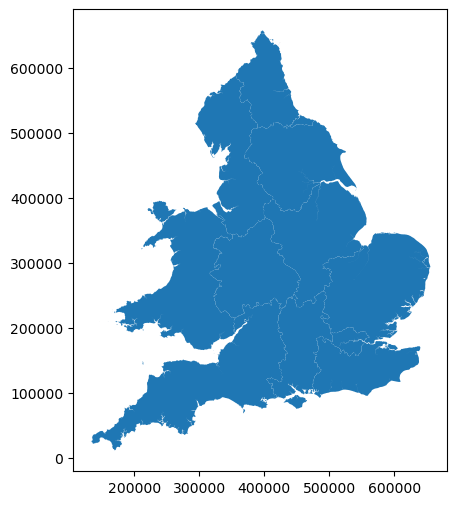

In [7]:
# Load IVT catchment shapefile
gdf_amb_catchment = gpd.read_file(
    os.path.join(paths.data, paths.shapefiles, paths.amb_catchment),
    crs='EPSG:27700')

# Set index
gdf_amb_catchment.set_index(['ambulance_'], inplace=True)

# Preview the dataframe
display(gdf_amb_catchment.head(2))

# Plot the shapefile
gdf_amb_catchment.plot(figsize=(6, 6))
plt.show()

# Convert crs to epsg 3857
gdf_amb_catchment = gdf_amb_catchment.to_crs(epsg=3857)

### 1.3 Define functions for calculating weighted mean

Group data by specified geography (e.g. closest IVT unit) and calculate the weighted average of specified columns - [see stackoverflow tutorial here](https://stackoverflow.com/questions/31521027/groupby-weighted-average-and-sum-in-pandas-dataframe).

In [8]:
def weighted_av(df, group_by, col, new_col, weight='population_all'):
    '''
    Groupby specified column and then find weighted average of another column
    Returns normal mean and weighted mean
    Inputs:
    - df - dataframe, contains data and columns to do calculation
    - group_by - string, column to group by
    - col - string, column to find average of
    - new_col - string, name of column which will contain weighted mean
    - weight - string, name of column to weight by, default 'population_all'
    '''
    res = (df
           .groupby(group_by)
           .apply(lambda x: pd.Series([np.mean(x[col]),
                                       np.average(x[col], weights=x[weight])],
                                      index=['mean', new_col])))
    return (res)

Group data by specific geography (e.g. ambulance trust) and calculate proportion.

In [9]:
def find_proportion(subgroup_col, overall_col, proportion_col, group_col, df):
    '''
    Groupby a particular geography, and find a proportion from two provided
    columns
    Inputs:
    subgroup_col - string, numerator, has population counts for a subgroup
    overall_col - string, denominator, has population count overall
    proportion_col - string, name for the column produced
    group_col - string, column to groupby when calculate proportions
    df - dataframe, with columns used above
    '''
    # Sum the columns for each group
    res = df.groupby(group_col).agg({
        subgroup_col: 'sum',
        overall_col: 'sum'
    })

    # Find the proportions for each group
    res[proportion_col] = res[subgroup_col] / res[overall_col]

    return res

### 1.4 Extract boundaries

Extract the bounds of each IVT catchment.

In [10]:
eng_wales_bounds = gdf_ivt_catchment.bounds
eng_wales_bounds.head(2)

,minx,miny,maxx,maxy
closest_iv,,,,
B152TH,-228159.802962,6.840962e+06,-186486.338536,6.891587e+06
B714HJ,-230754.673759,6.862190e+06,-174024.968174,6.926919e+06


### 1.5 Define mapping functions

Non-overlapping labels of each stroke unit - [see stackoverflow explanation here](https://stackoverflow.com/questions/43916834/matplotlib-dynamically-change-text-position).

In [11]:
def add_nonoverlapping_text_labels(units, ax, col,
                                   y_step=0.05, fontsize=7):
    '''
    Creates non-overlapping text labels for stroke units to the input axis
    Inputs:
    - units - dataframe, contains data on each hospital
    - ax - axis object, to add labels to
    - col - string, label for each position
    - y_step - number, amount to adjust position on y axis by
    - fontsize - number, size of font in labels
    Output:
    - ax - axis object with addition of text labels
    '''
    # Create empty array
    text_rectangles = []

    # Sort labels descending in y axis (gives better results)
    units.loc[:, 'sort_by'] = units.geometry.y
    units = units.sort_values(by='sort_by', ascending=False, axis=0)
    del units['sort_by']

    # Add labels to the plot
    # Loop through each stroke unit - in each loop, get x, y and label
    geom_unit = zip(units.geometry.x, units.geometry.y, units[col])
    for x, y, label in geom_unit:

        # Add label to the axis (xy is location of point)
        text = ax.annotate(
            text=label,
            xy=(x, y),  # location of point
            xytext=(8, 8),  # location of text that goes with point
            textcoords='offset points',  # offset text in points from xy value
            fontsize=fontsize,
            bbox=dict(facecolor='w', alpha=0.3, edgecolor='none',
                      boxstyle="round", pad=0.1))

        # Adjust text position by by 2 x axis points and get axes bounding box
        x, y = text.get_position()
        new_x = x - 2
        text.set_position((new_x, y))
        rect = text.get_window_extent()

        # While text intersects with other text from rectangles of axis,
        # iterate over different y positions 10 times, checking if it prevents
        # overlap. If still intersect, just use original position
        for other_rect in text_rectangles:
            iterations = 0
            while Bbox.intersection(rect, other_rect) and iterations < 10:
                x, y = text.get_position()
                new_y = y - y_step
                text.set_position((x, new_y))
                rect = text.get_window_extent()
                iterations += 1
            if iterations == 10:
                # No improved location found; use original position
                text.set_position((x, y))
            text_rectangles.append(rect)

    return (ax)

In [12]:
def plot_map(gdf, col, col_readable, ax, include_legend, legend_kwds,
             units, base_map, show_labels, cmap):
    '''
    Create map of catchment areas, coloured by the provided column.
    Inputs:
    - gdf - geopandas dataframe with IVT catchment areas and col
    - col - string, column to colour map by
    - col_readable - string, column used to colour map
    - ax - axis object, to plot map on
    - include_legend - boolean, whether to display legend
    - legend_kwds - dictionary, characteristics of legend
    - units - dataframe, information on each stroke unit inc. location
    - base_map - boolean, whether to add base map
    - show_labels - boolean, whether to add hospital labels
    - cmap - string, colourmap to use
    '''
    # Plot IVT catchment areas
    gdf.plot(
        ax=ax,
        column=col,  # Column to apply colour
        antialiased=False,  # Avoids artifact boundry lines
        edgecolor='face',  # Make LSOA boundry same colour as area
        linewidth=0.0,  # Use linewidth=0 to hide boarder lines
        # vmin=0,  # Manual scale min (remove to make automatic)
        # vmax=70,  # Manual scale max (remove to make automatic)
        cmap=cmap,  # Colour map to use
        legend=include_legend,  # Whether to display legend
        legend_kwds=legend_kwds,  # Characteristics of legend
        alpha=0.7)  # Set transparency (to reveal basemap)

    # Add title if categorical (for numeric, it is done with legend_kwds)
    if not is_numeric_dtype(gdf[col]) and include_legend:
        leg = ax.get_legend()
        leg.set_title(col_readable)

    # Add country border
    outline.plot(ax=ax, edgecolor='k', facecolor='None', linewidth=1.0)

    # Add location of hospitals and - if True - labels for each hospital
    units.plot(ax=ax, edgecolor='k', facecolor='w', markersize=120, marker='*')
    if show_labels:
        ax = add_nonoverlapping_text_labels(
            units, ax, 'hospital_city', y_step=0.05, fontsize=8)

    # If True, add base map, specifying same CRS and using manual zoom to
    # adjust level of detail
    if base_map:
        ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=10)

    # Remove x and y ticks
    plt.setp(ax.get_xticklabels(), visible=False)
    plt.setp(ax.get_yticklabels(), visible=False)

    # Turn off axis line and numbers
    ax.set_axis_off()

In [13]:
def create_map(gdf, col, col_readable, gdf_units,
               base_map, show_labels, cmap='inferno_r'):
    '''
    Creates map of England and Wales, with an inset map of London. Shows
    IVT catchment areas, coloured by value from specified column. Uses the
    plot_map() function to create each map (main and inset).
    Inputs:
    - gdf - geopandas dataframe with polygons and col
    - col - string, column to colour map by
    - col_readable - string, used for legend and plot title
    - gdf_units - dataframe, information on each stroke unit inc. location
    - base_map - boolean, whether to add base map
    - cmap - string, colourmap to use on maps, default 'inferno_r'
    '''
    # Set up figure with max dimensions of 10x10 inch
    fig, ax = plt.subplots(figsize=(20, 20))

    # Set legend kwds if is numeric, else blank
    if is_numeric_dtype(gdf[col]):
        legend_kwds = {'shrink': 0.5, 'label': f'{col_readable}'}
    else:
        legend_kwds = {}

    # Plot map for England and Wales
    plot_map(gdf, col, col_readable, ax,
             include_legend=True,
             legend_kwds=legend_kwds,
             units=gdf_units,
             base_map=base_map,
             show_labels=show_labels,
             cmap=cmap)

    # Make space at bottom for inset map of London
    ax.set_ylim(ax.get_ylim()[0] - 100000, ax.get_ylim()[1])

    # Make space on right for hospital name label
    ax.set_xlim(ax.get_xlim()[0], ax.get_xlim()[1] + 50000)

    # Create inset axis in bottom right corner
    axins = ax.inset_axes([0.8, 0.05, 0.18, 0.18])

    # Identify London hospitals to go in the inset map
    london_mask = gdf_units["Strategic Clinical Network"] == "London SCN"
    london_hospitals = gdf_units["Hospital_name"][london_mask].to_list()
    london_units = gdf_units[london_mask]

    # Identify map area to plot in the inset map
    # initialise exteme values
    minx_ = np.inf
    miny_ = np.inf
    maxx_ = 0
    maxy_ = 0
    # Find min and max x and y for the london hospitals
    for h in london_hospitals:
        minx, miny, maxx, maxy = eng_wales_bounds.loc[h]
        minx_ = min(minx_, minx)
        miny_ = min(miny_, miny)
        maxx_ = max(maxx_, maxx)
        maxy_ = max(maxy_, maxy)

    # Set extent of inset map
    axins.set_xlim(minx_, maxx_)
    axins.set_ylim(miny_, maxy_)

    # Define lines connecting inset map to main map
    mark_inset(ax, axins, loc1=2, loc2=3, fc="none", ec="0.5")

    # Plot inset map of London
    plot_map(gdf, col, col_readable, axins,
             include_legend=False,
             legend_kwds={},
             units=london_units,
             base_map=base_map,
             show_labels=show_labels,
             cmap=cmap)

    # Set title
    ax.set_title(f'{col_readable}')

    # Adjust for printing
    ax.margins(0)
    ax.apply_aspect()
    plt.subplots_adjust(left=0.01, right=1.0, bottom=0.0, top=1.0)
    plt.savefig(f'figures/map_{col}.png', dpi=300)
    plt.show()

    # If colouring column is numeric, do some further analysis
    if is_numeric_dtype(gdf[col]):
        # Print information on the range and median
        display(f'Range: {round(gdf[col].min(),3)} to ' +
                f'{round(gdf[col].max(),3)}')
        display(f'Median: {round(gdf[col].median(),3)}')

        # Histogram showing range in that col
        plt.hist(gdf[col])
        plt.xlabel(col_readable)
        plt.ylabel('Number of catchment areas')
        plt.show()

## 2 IVT catchment statistics

### IVT catchment map

Information on using different colours for adjacent polygons [available here](https://pysal.org/mapclassify/notebooks/05_Greedy_coloring.html).

In [14]:
# Use greedy to assign colours wherein adjacent polygons are never the same
# greedy(gdf_ivt_catchment.index, strategy='balanced', min_distance=1)

### Population-weighted mean income domain score by IVT catchment

In [15]:
# Weighted mean income domain score by closest IVT unit
df_ivt_ids = weighted_av(
    df_lsoa, group_by='closest_ivt_unit',
    col='income_domain_score', new_col='income_domain_weighted_mean')
df_ivt_ids

,mean,income_domain_weighted_mean
closest_ivt_unit,,
B152TH,0.180572,0.182951
B714HJ,0.195096,0.202612
BA13NG,0.083828,0.083469
BA214AT,0.096528,0.095511
BB23HH,0.172242,0.177377
...,...,...
WD180HB,0.079041,0.080071
WF14DG,0.148147,0.148666
WR51DD,0.095798,0.093969


In [16]:
# Add mean IoD to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(
    df_ivt_ids['income_domain_weighted_mean']))

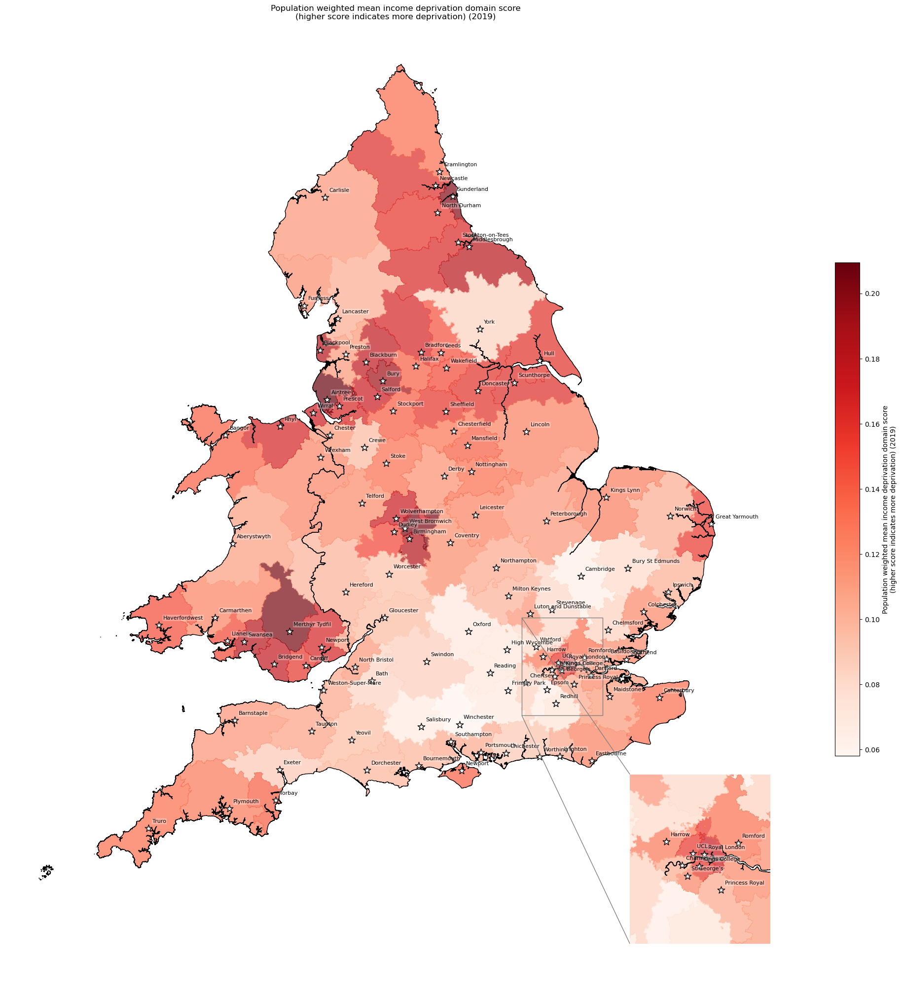

'Range: 0.058 to 0.209'

'Median: 0.122'

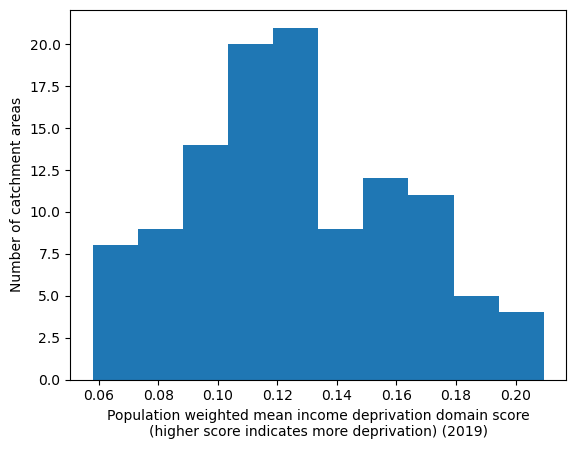

4:80: E501 line too long (80 > 79 characters)


In [17]:
# Create map
create_map(gdf=gdf_ivt_catchment.reset_index(),
           col='income_domain_weighted_mean',
           col_readable=('Population weighted mean income deprivation domain ' +
                         'score\n(higher score indicates more deprivation) ' +
                         '(2019)'),
           gdf_units=gdf_units,
           base_map=False,
           show_labels=True,
           cmap='Reds')

### Population-weighted mean IMD score by IVT catchment

In [18]:
# Weighted mean IMD by closest IVT unit
df_ivt_imd = weighted_av(
    df_lsoa, group_by='closest_ivt_unit',
    col='imd_2019_score', new_col='imd_weighted_mean')
df_ivt_imd

,mean,imd_weighted_mean
closest_ivt_unit,,
B152TH,31.070594,31.488294
B714HJ,32.588740,33.655519
BA13NG,13.353572,13.335982
BA214AT,16.946994,16.858199
BB23HH,31.070595,31.789134
...,...,...
WD180HB,12.004248,12.153052
WF14DG,26.534618,26.646876
WR51DD,16.780844,16.451837


In [19]:
# Add mean IMD to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(
    df_ivt_imd['imd_weighted_mean']))

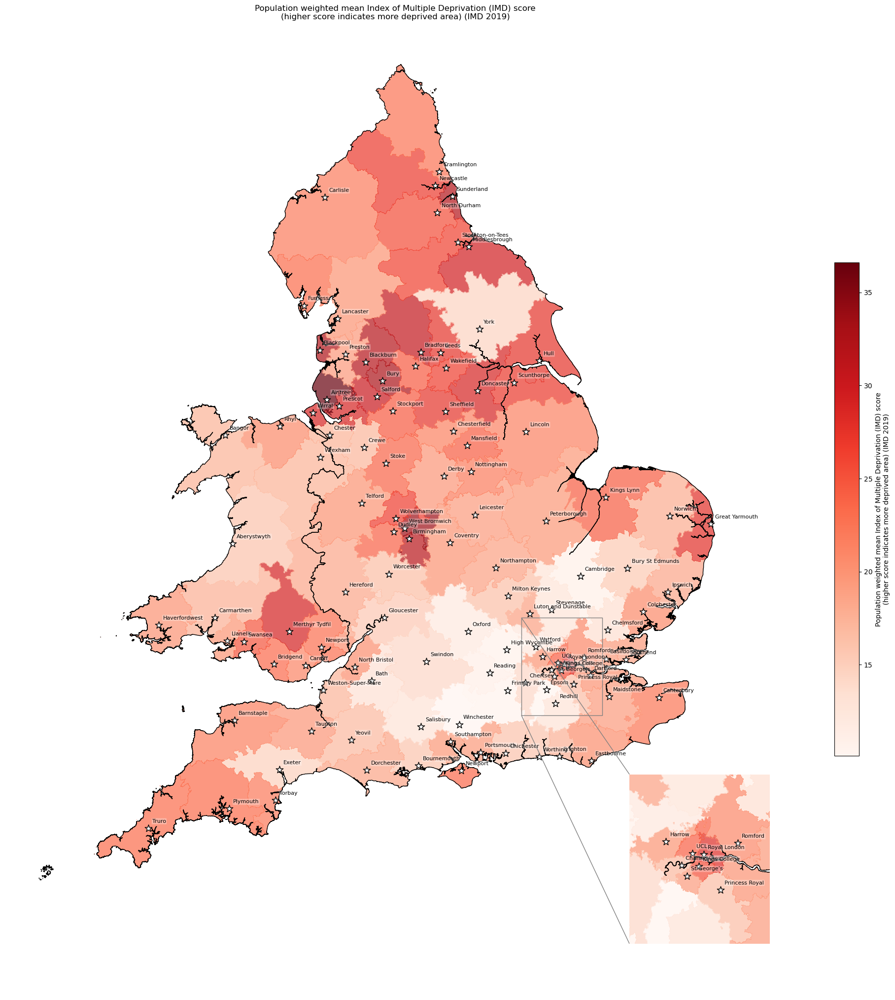

'Range: 10.093 to 36.601'

'Median: 20.032'

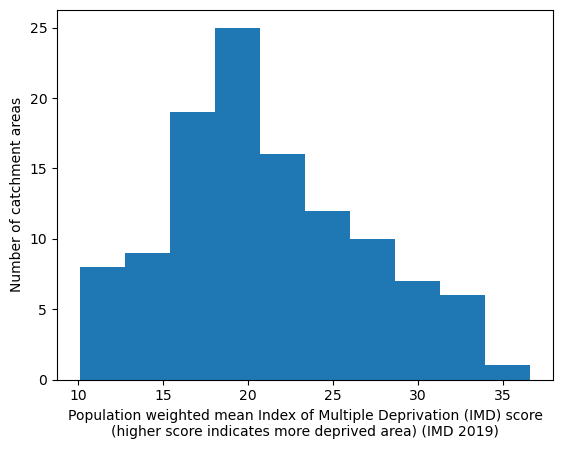

In [20]:
# Create map
create_map(
    gdf=gdf_ivt_catchment.reset_index(),
    col='imd_weighted_mean',
    col_readable=('Population weighted mean Index of Multiple Deprivation ' +
                  '(IMD) score\n(higher score indicates more deprived area) ' +
                  '(IMD 2019)'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### IVT catchment size

The range of people across the 113 catchments is: 87086 to 1479138
Median number of people: 483031.0


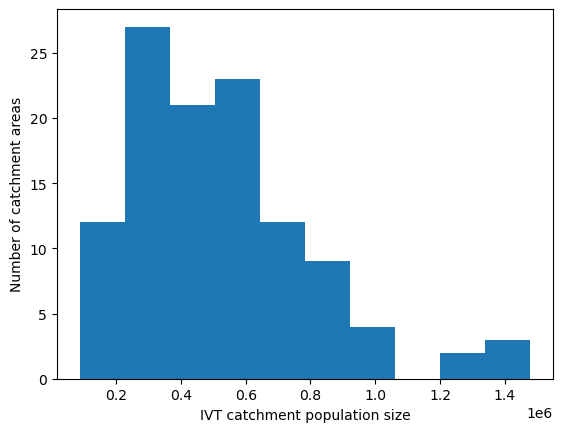

In [21]:
# Calculate populations
pop = df_lsoa.groupby('closest_ivt_unit')['population_all'].sum()

# Print the range in population size of each catchment area
print(f'The range of people across the {pop.shape[0]} catchments is: ' +
      f'{round(pop.min(),1)} to ' +
      f'{round(pop.max(),1)}')

# Print the median population size
print(f'Median number of people: {round(pop.median(),2)}')

# Create histogram to show distribution in population size of catchment areas
plt.hist(pop)
plt.xlabel('IVT catchment population size')
plt.ylabel('Number of catchment areas')
plt.show()

### Ethnicity - proportion ethnic minority by IVT catchment

[Fluck et al. 2023](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9891657/) Nature publication using SSNAP data to compare stroke outcomes in caucasion population versus ethnic minorities, finding people from ethnic minorities have earlier onset and more adverse outcomes.

In the maps, I have present the proportion of people in each IVT catchment area who are an ethnic minorities (language as per [government recommendations](https://www.ethnicity-facts-figures.service.gov.uk/style-guide/writing-about-ethnicity)).

In [22]:
# Show the ethnic groups
[col for col in df_lsoa if col.startswith('ethnic_group')]

['ethnic_group_all_categories_ethnic_group',
 'ethnic_group_white_total',
 'ethnic_group_white_english_welsh_scottish_northern_irish_british',
 'ethnic_group_white_irish',
 'ethnic_group_white_gypsy_or_irish_traveller',
 'ethnic_group_white_other_white',
 'ethnic_group_mixed_multiple_ethnic_group_total',
 'ethnic_group_mixed_multiple_ethnic_group_white_and_black_caribbean',
 'ethnic_group_mixed_multiple_ethnic_group_white_and_black_african',
 'ethnic_group_mixed_multiple_ethnic_group_white_and_asian',
 'ethnic_group_mixed_multiple_ethnic_group_other_mixed',
 'ethnic_group_asian_asian_british_total',
 'ethnic_group_asian_asian_british_indian',
 'ethnic_group_asian_asian_british_pakistani',
 'ethnic_group_asian_asian_british_bangladeshi',
 'ethnic_group_asian_asian_british_chinese',
 'ethnic_group_asian_asian_british_other_asian',
 'ethnic_group_black_african_caribbean_black_british_total',
 'ethnic_group_black_african_caribbean_black_british_african',
 'ethnic_group_black_african_caribb

In [23]:
# Add count of non-white (combines mixed, asian, black + other categories)
df_lsoa['ethnic_group_not_white'] = (
    df_lsoa['ethnic_group_all_categories_ethnic_group'] -
    df_lsoa['ethnic_group_white_total'])

In [24]:
# Find proportion with bad or very bad general health by IVT catchment
ethnicity = find_proportion(
    subgroup_col='ethnic_group_not_white',
    overall_col='ethnic_group_all_categories_ethnic_group',
    proportion_col='ethnic_minority_proportion',
    group_col='closest_ivt_unit',
    df=df_lsoa
)

ethnicity.head()

,ethnic_group_not_white,ethnic_group_all_categories_ethnic_group,ethnic_minority_proportion
closest_ivt_unit,,,
B152TH,296338,906743,0.326816
B714HJ,307488,958616,0.320762
BA13NG,17349,448923,0.038646
BA214AT,5261,261069,0.020152
BB23HH,86542,473321,0.182840


In [25]:
# Add proportion to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(
    ethnicity['ethnic_minority_proportion']))

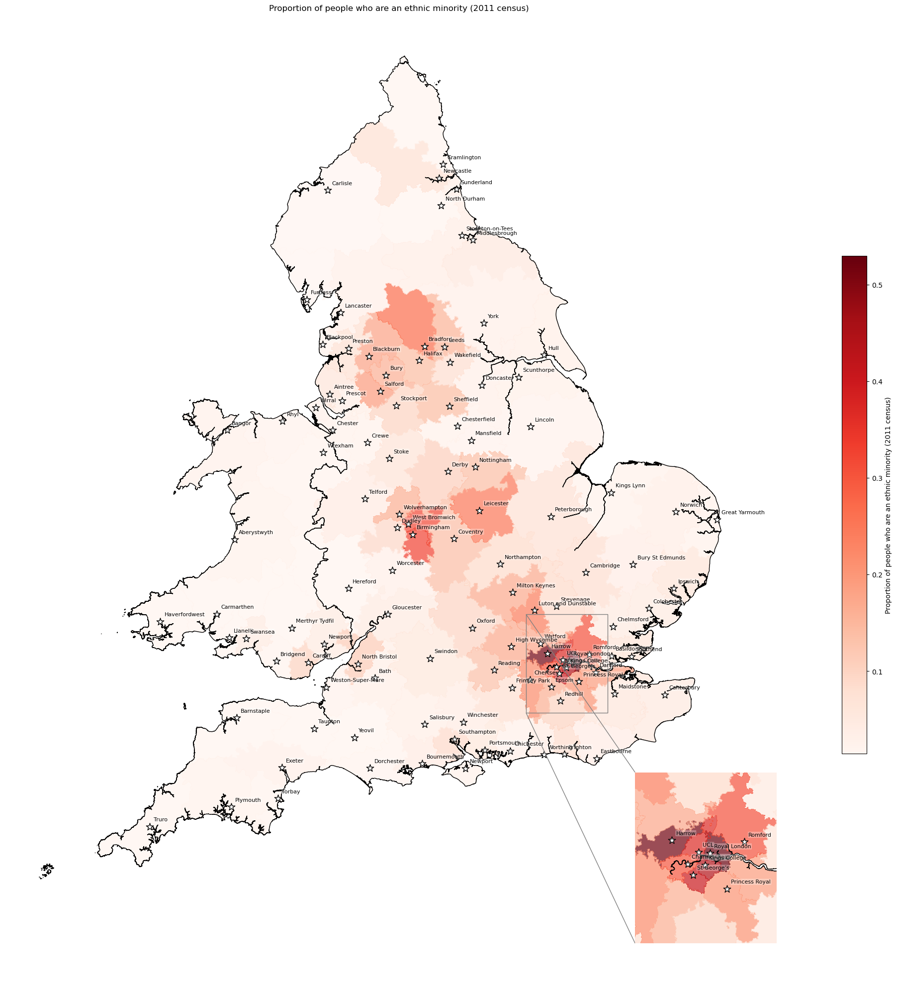

'Range: 0.015 to 0.53'

'Median: 0.05'

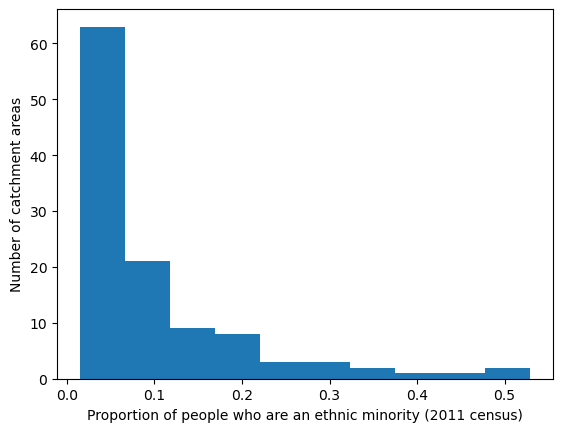

In [26]:
# Create map
create_map(
    gdf=gdf_ivt_catchment.reset_index(),
    col='ethnic_minority_proportion',
    col_readable=('Proportion of people who are an ethnic minority ' +
                  '(2011 census)'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### General health - proportion with bad/very bad health by IVT catchment

In [27]:
# Find proportion with bad or very bad general health by IVT catchment
bad_health = find_proportion(
    subgroup_col='bad_or_very_bad_health',
    overall_col='all_categories_general_health',
    proportion_col='bad_health_proportion',
    group_col='closest_ivt_unit',
    df=df_lsoa
)

bad_health.head()

,bad_or_very_bad_health,all_categories_general_health,bad_health_proportion
closest_ivt_unit,,,
B152TH,55724,906743,0.061455
B714HJ,65605,958616,0.068437
BA13NG,19467,448923,0.043364
BA214AT,12458,261069,0.047719
BB23HH,32885,473321,0.069477


In [28]:
# Add proportion to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(
    bad_health['bad_health_proportion']))

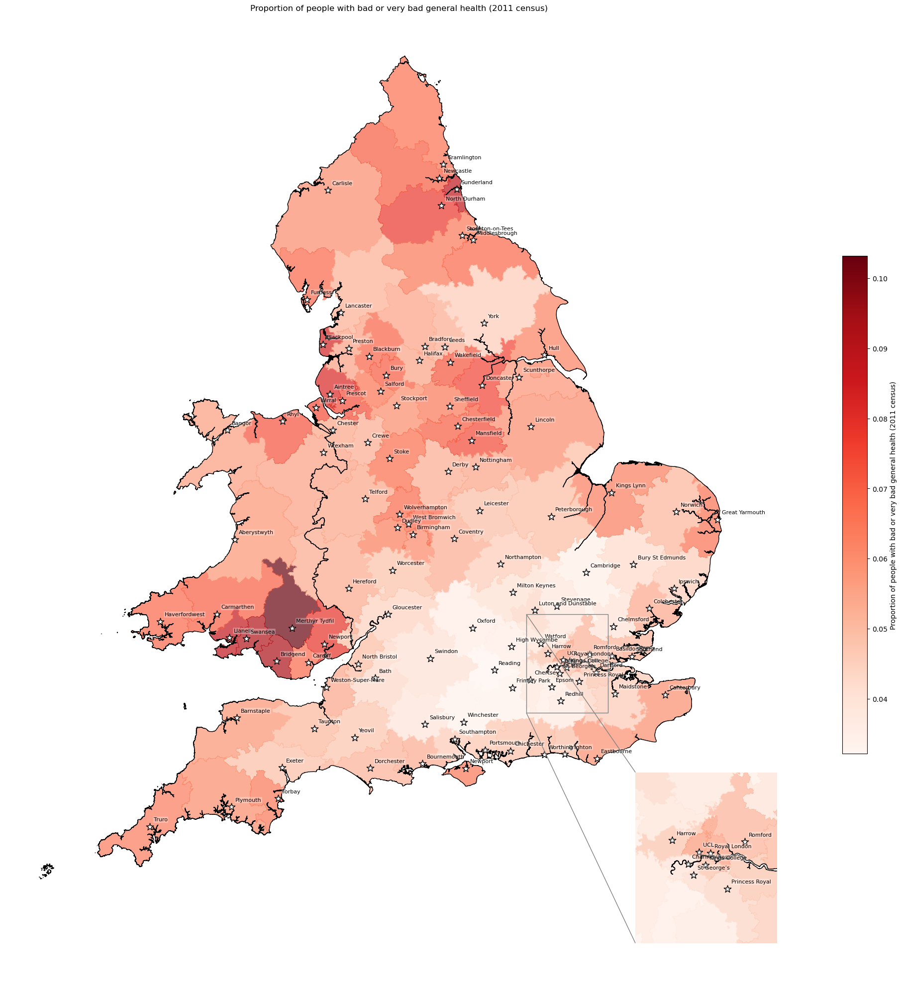

'Range: 0.032 to 0.103'

'Median: 0.055'

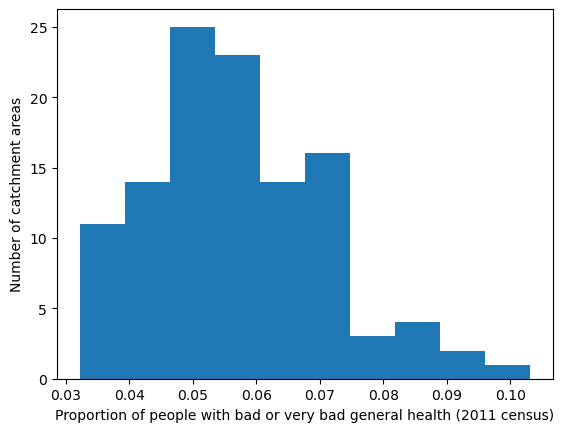

In [29]:
# Create map
create_map(
    gdf=gdf_ivt_catchment.reset_index(),
    col='bad_health_proportion',
    col_readable=('Proportion of people with bad or very bad general health ' +
                  '(2011 census)'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Long-term health problem or disability - proportion by IVT catchment

In [30]:
# Add column with count of long-term health problem (limited a little or alot)
df_lsoa['long_term_health_count'] = (
    df_lsoa['all_categories_long_term_health_problem_or_disability'] -
    df_lsoa['day_to_day_activities_not_limited'])

In [31]:
# Find proportion with long-term health problem by IVT catchment
long_term = find_proportion(
    subgroup_col='long_term_health_count',
    overall_col='all_categories_long_term_health_problem_or_disability',
    proportion_col='long_term_health_proportion',
    group_col='closest_ivt_unit',
    df=df_lsoa
)

long_term.head()

,long_term_health_count,all_categories_long_term_health_problem_or_disability,long_term_health_proportion
closest_ivt_unit,,,
B152TH,157057,889227,0.176622
B714HJ,180021,947524,0.189991
BA13NG,70366,438597,0.160434
BA214AT,45407,254179,0.178642
BB23HH,93679,468472,0.199967


In [32]:
# Add proportion to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(
    long_term['long_term_health_proportion']))

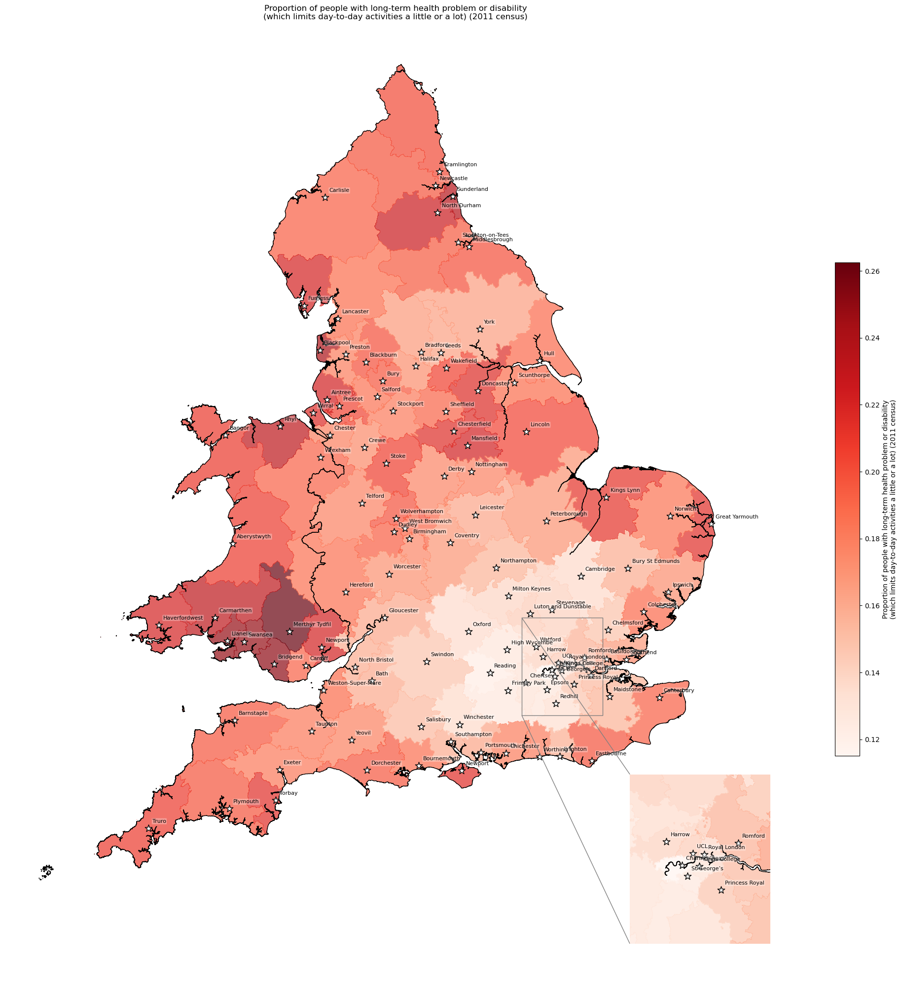

'Range: 0.115 to 0.262'

'Median: 0.182'

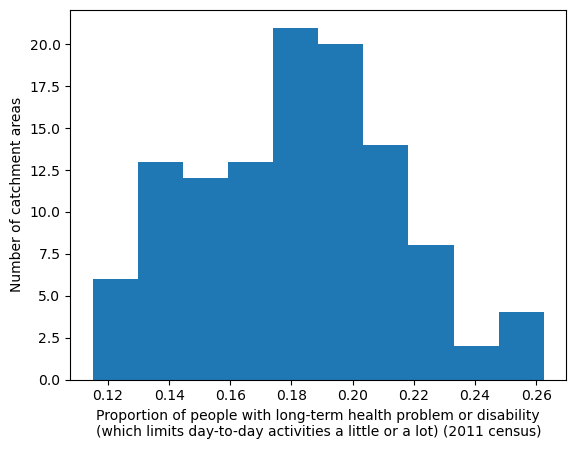

In [33]:
# Create map
create_map(
    gdf=gdf_ivt_catchment.reset_index(),
    col='long_term_health_proportion',
    col_readable=('Proportion of people with long-term health problem or ' +
                  'disability\n(which limits day-to-day activities a ' +
                  'little or a lot) (2011 census)'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Rural/urban - proportion of people living in rural areas by IVT catchment

The LSOA rural/urban classification had 8 categories. The local authority rural urban classification is based on the percentage of residents living in rural areas (and then has 6 classes). Hence, for each IVT catchment, I have presented the percentage of residents living in rural areas.

In [34]:
df_lsoa['rural_urban_2011'].value_counts()

rural_urban_2011
Urban city and town                                15724
Urban major conurbation                            11523
Rural town and fringe                               3189
Rural village and dispersed                         2490
Urban minor conurbation                             1208
Rural village and dispersed in a sparse setting      327
Rural town and fringe in a sparse setting            197
Urban city and town in a sparse setting               94
Name: count, dtype: int64

In [35]:
# Extract if is rural or if is urban (each classification starts with that)
df_lsoa['ruc_overall'] = df_lsoa['rural_urban_2011'].str[:5]

In [36]:
# Groupby IVT unit and find total rural or urban
ruc = (df_lsoa.groupby(
    ['closest_ivt_unit', 'ruc_overall'])['population_all'].sum())

# Reformat dataframe
ruc = ruc.reset_index(name='population')
ruc = ruc.pivot(
    index='closest_ivt_unit',
    columns='ruc_overall',
    values='population').reset_index().rename_axis(None, axis=1)

# Set NaN to 0
ruc = ruc.replace(np.nan, 0)

# Find proportion rural for each trust
ruc['proportion_rural'] = ruc['Rural'] / (ruc['Rural'] + ruc['Urban'])

# Set index to closest IVT unit
ruc = ruc.set_index('closest_ivt_unit')

# Preview dataframe
ruc.head()

,Rural,Urban,proportion_rural
closest_ivt_unit,,,
B152TH,36603.0,926409.0,0.038009
B714HJ,30814.0,981575.0,0.030437
BA13NG,117604.0,365427.0,0.243471
BA214AT,177608.0,96824.0,0.647184
BB23HH,63171.0,422949.0,0.129949


In [37]:
# Add proportion to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(
    ruc['proportion_rural']))

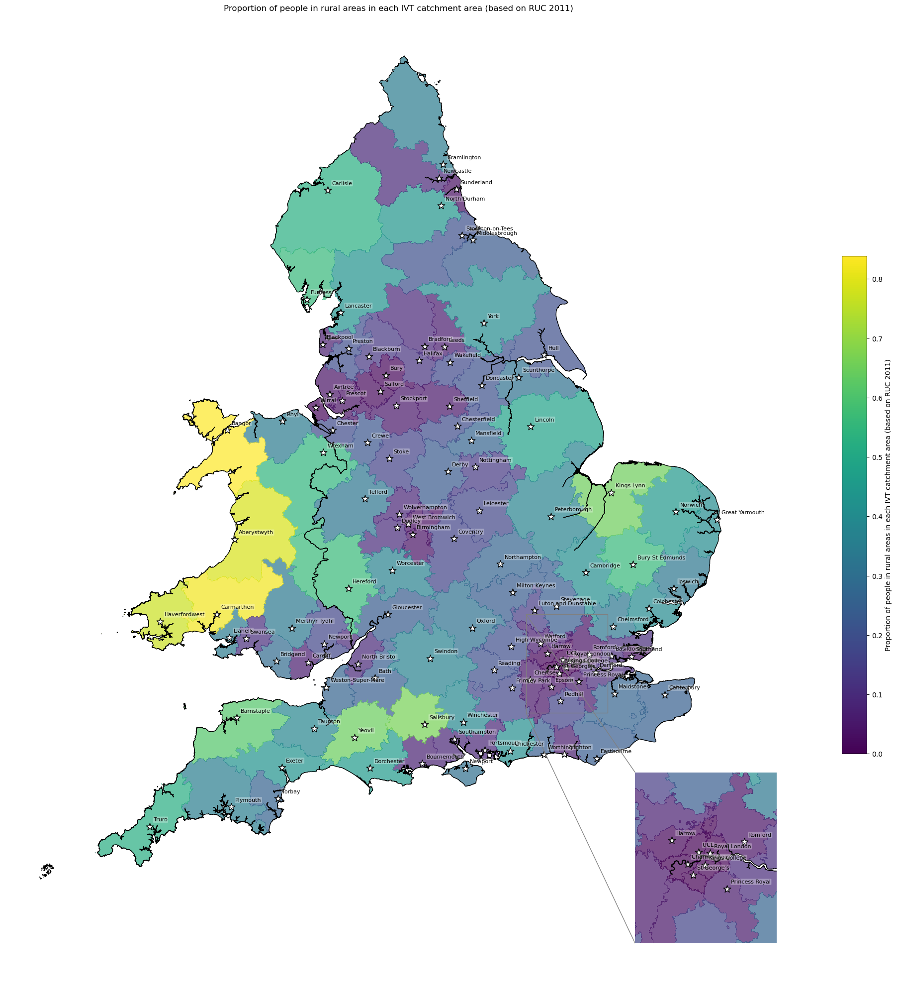

'Range: 0.0 to 0.838'

'Median: 0.22'

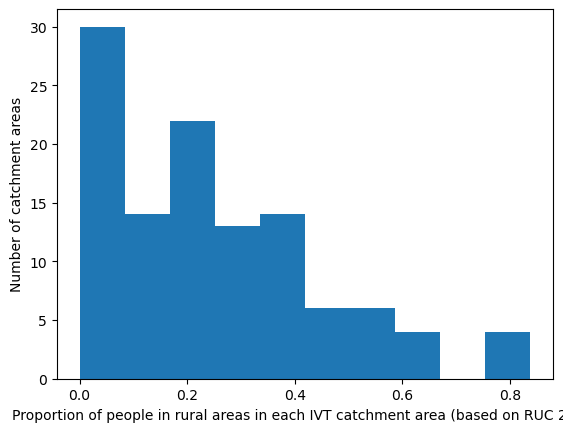

In [38]:
# Create map
create_map(
    gdf=gdf_ivt_catchment.reset_index(),
    col='proportion_rural',
    col_readable=('Proportion of people in rural areas in each IVT ' +
                  'catchment area (based on RUC 2011)'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='viridis')

### Age - proportion aged 65+ by IVT catchment

The age band reflect the bottom of the band - so age_band_65 is people aged 65, 66, 67, 68 and 69.

In [39]:
# Find count of people age 65 plus
df_lsoa['age_65_plus_count'] = df_lsoa[[
    'age_band_all_65', 'age_band_all_70', 'age_band_all_75',
    'age_band_all_80', 'age_band_all_85', 'age_band_all_90']].sum(axis=1)

In [40]:
# Find proportion age 65 plus by IVT catchment
age_65 = find_proportion(
    subgroup_col='age_65_plus_count',
    overall_col='population_all',
    proportion_col='age_65_plus_proportion',
    group_col='closest_ivt_unit',
    df=df_lsoa
)

age_65.head()

,age_65_plus_count,population_all,age_65_plus_proportion
closest_ivt_unit,,,
B152TH,144555,963012,0.150107
B714HJ,159109,1012389,0.157162
BA13NG,102838,483031,0.212901
BA214AT,72947,274432,0.265811
BB23HH,88140,486120,0.181313


In [41]:
# Add proportion to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(
    age_65['age_65_plus_proportion']))

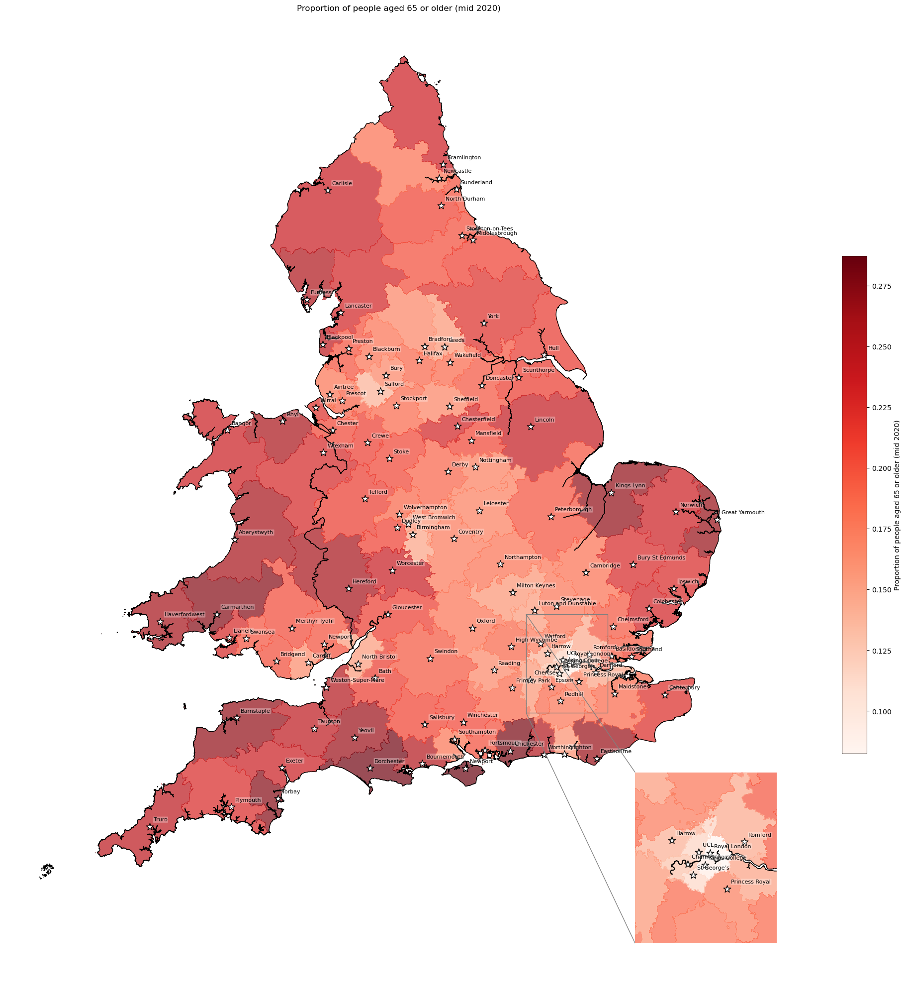

'Range: 0.082 to 0.287'

'Median: 0.203'

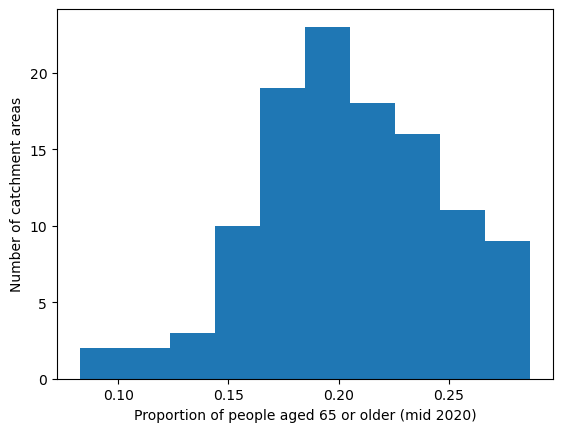

In [42]:
# Create map
create_map(
    gdf=gdf_ivt_catchment.reset_index(),
    col='age_65_plus_proportion',
    col_readable=('Proportion of people aged 65 or older (mid 2020)'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Thrombolysis rates for each IVT unit

Thrombolysis rate here is the rate for the closest IVT unit (not specific to LSOAs - so its proportion of all admissions to that unit, not just of those from that LSOA)

In [43]:
# Extract rate for each unit, with unit as index
ivt_rate = (df_lsoa[['closest_ivt_unit', 'ivt_rate']]
            .drop_duplicates()
            .set_index('closest_ivt_unit')['ivt_rate'])

In [44]:
# Add rate to geopandas dataframe
gdf_ivt_catchment = (gdf_ivt_catchment.join(ivt_rate))

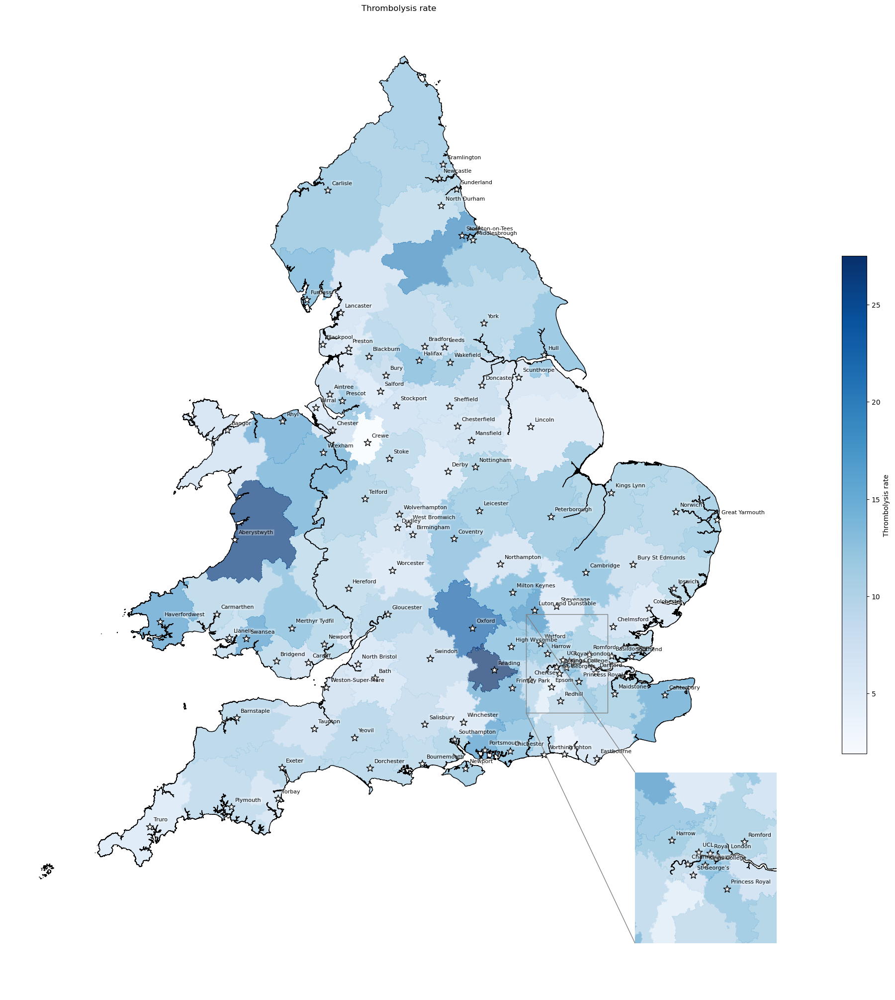

'Range: 1.9 to 27.5'

'Median: 10.6'

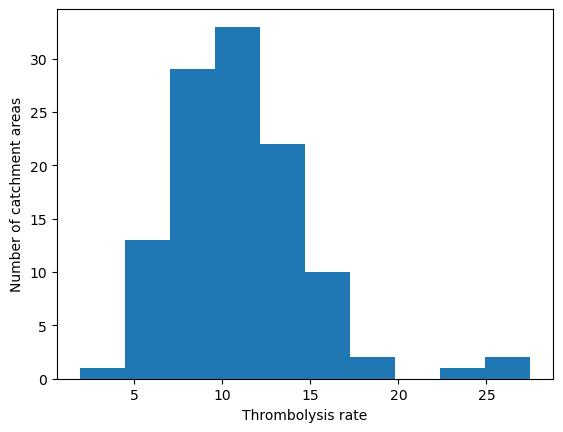

In [45]:
# Create map
create_map(
    gdf=gdf_ivt_catchment,
    col='ivt_rate',
    col_readable='Thrombolysis rate',
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Blues')

### Population density

Calculation of population density based on archive/05_create_proportion_over_65_maps and these stack overflow posts: [post 1](https://gis.stackexchange.com/questions/218450/getting-polygon-areas-using-geopandas) and [post 2](https://stackoverflow.com/questions/67796160/calculate-density-based-on-lat-lon)

In [46]:
# Find population of each IVT catchment
pop = df_lsoa.groupby('closest_ivt_unit')['population_all'].sum()

In [47]:
# Add total population size to geopandas
gdf_ivt_catchment = (gdf_ivt_catchment.join(pop))

In [48]:
# Change the projection to a Cartesian system (EPSG:3857) and get area in
# square kilometers (through /10**6)
gdf_ivt_catchment['polygon_area'] = (
    gdf_ivt_catchment.to_crs('epsg:3857').area / 10**6)

# Divide population by area to get population density
gdf_ivt_catchment['population_density'] = (
    gdf_ivt_catchment['population_all'] / gdf_ivt_catchment['polygon_area'])

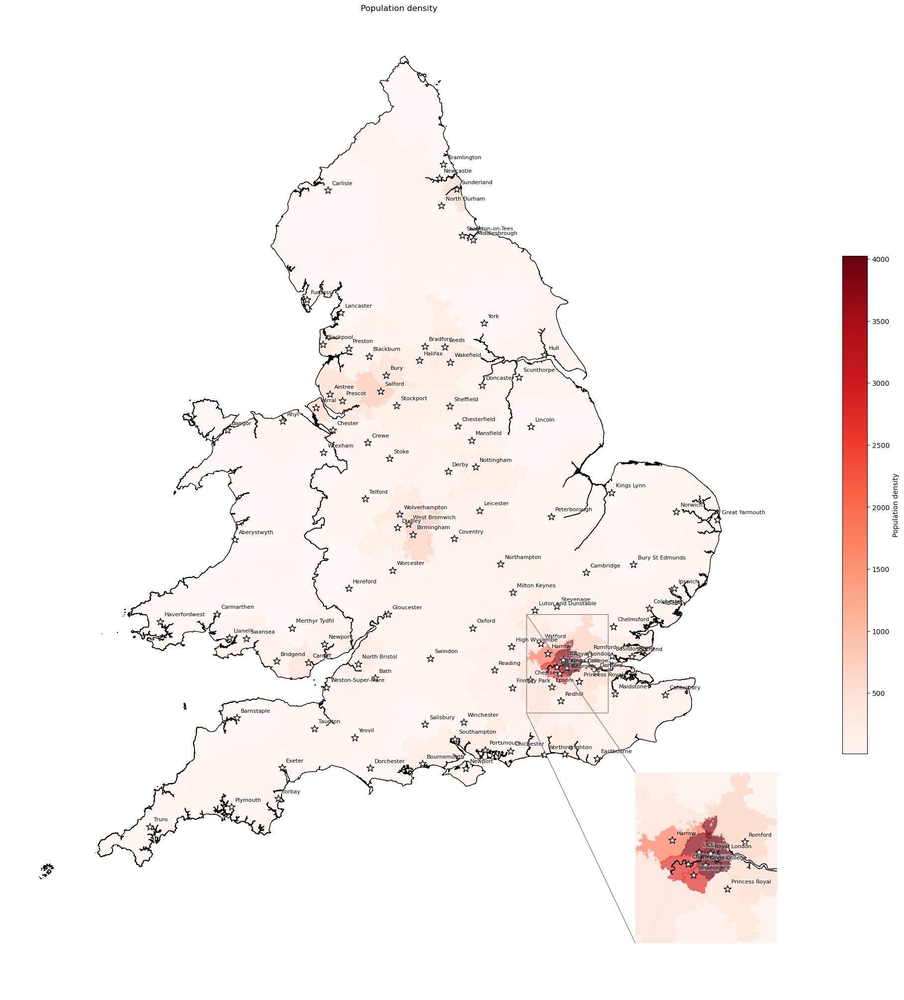

'Range: 9.482 to 4023.447'

'Median: 152.691'

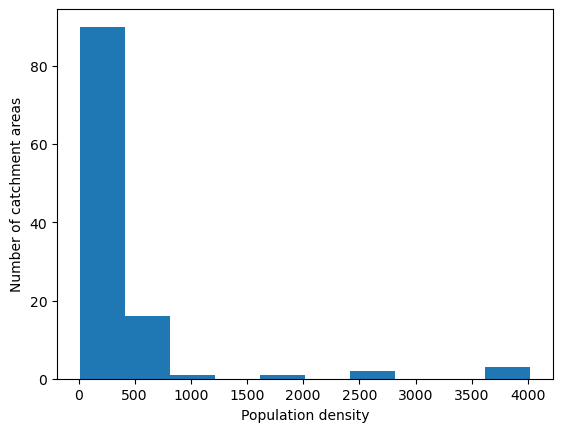

In [49]:
# Create map
create_map(
    gdf=gdf_ivt_catchment,
    col='population_density',
    col_readable='Population density',
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Average travel time to IVT unit weighted by number of over 65 year olds in catchment

In [50]:
# Find mean time to IVT weighted by 65+ population size of each LSOA
ivt_time = weighted_av(
    df=df_lsoa, group_by='closest_ivt_unit',
    col='closest_ivt_unit_time', new_col='weighted_ivt_time',
    weight='age_65_plus_count')

ivt_time

,mean,weighted_ivt_time
closest_ivt_unit,,
B152TH,18.971119,19.881289
B714HJ,18.613081,19.355652
BA13NG,24.218246,25.199316
BA214AT,23.251572,24.275645
BB23HH,19.500654,20.295453
...,...,...
WD180HB,19.495918,19.740606
WF14DG,18.663793,18.843356
WR51DD,20.794239,22.107489


In [51]:
# Add time to geopandas dataframe
# Add total population size to geopandas
gdf_ivt_catchment = (gdf_ivt_catchment.join(ivt_time['weighted_ivt_time']))

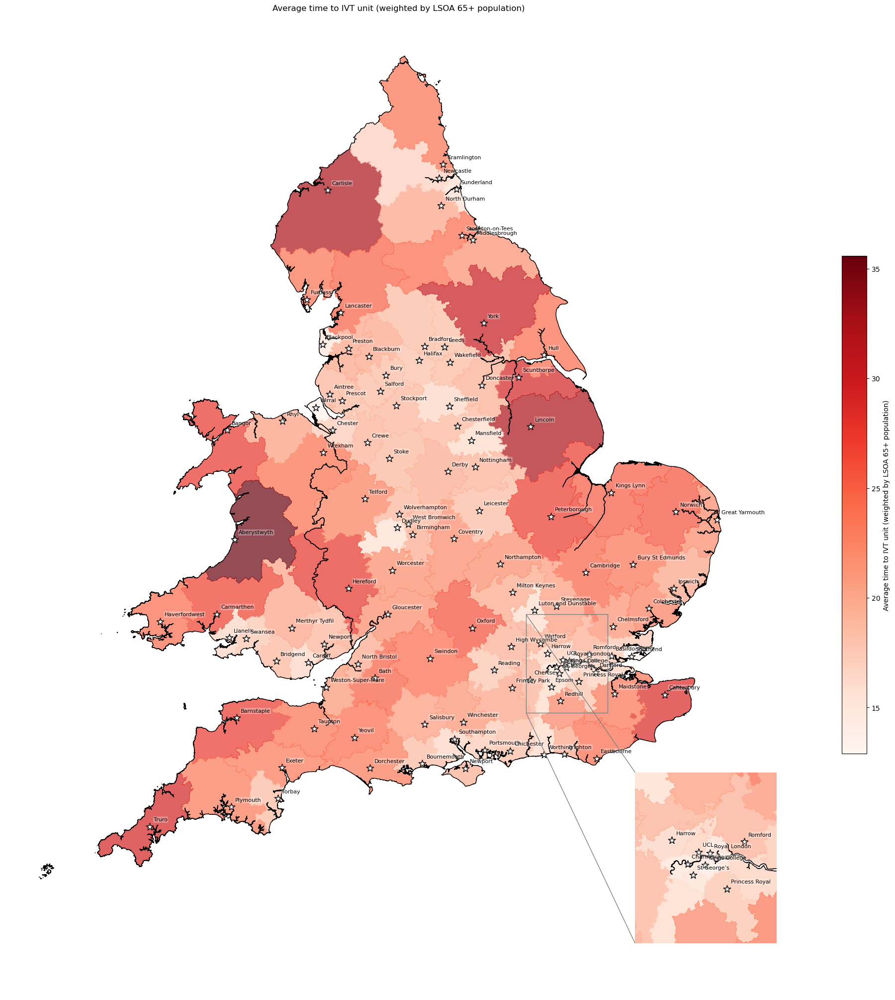

'Range: 12.891 to 35.582'

'Median: 20.089'

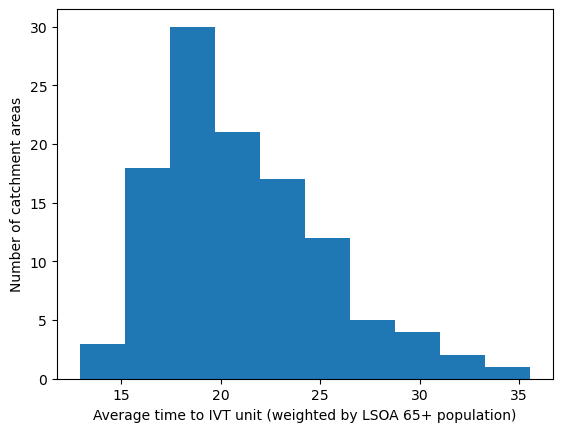

In [52]:
# Create map
create_map(
    gdf=gdf_ivt_catchment,
    col='weighted_ivt_time',
    col_readable='Average time to IVT unit (weighted by LSOA 65+ population)',
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Proportion of 65+ year olds living within 30 minutes of their closest IVT unit (in 06_create_ave_travel_time_maps)

## 3 Ambulance service statistics

### Ambulance service map

In [53]:
# Add ambulance service as a column for the mapping function
gdf_amb_catchment['ambulance_service'] = gdf_amb_catchment.index

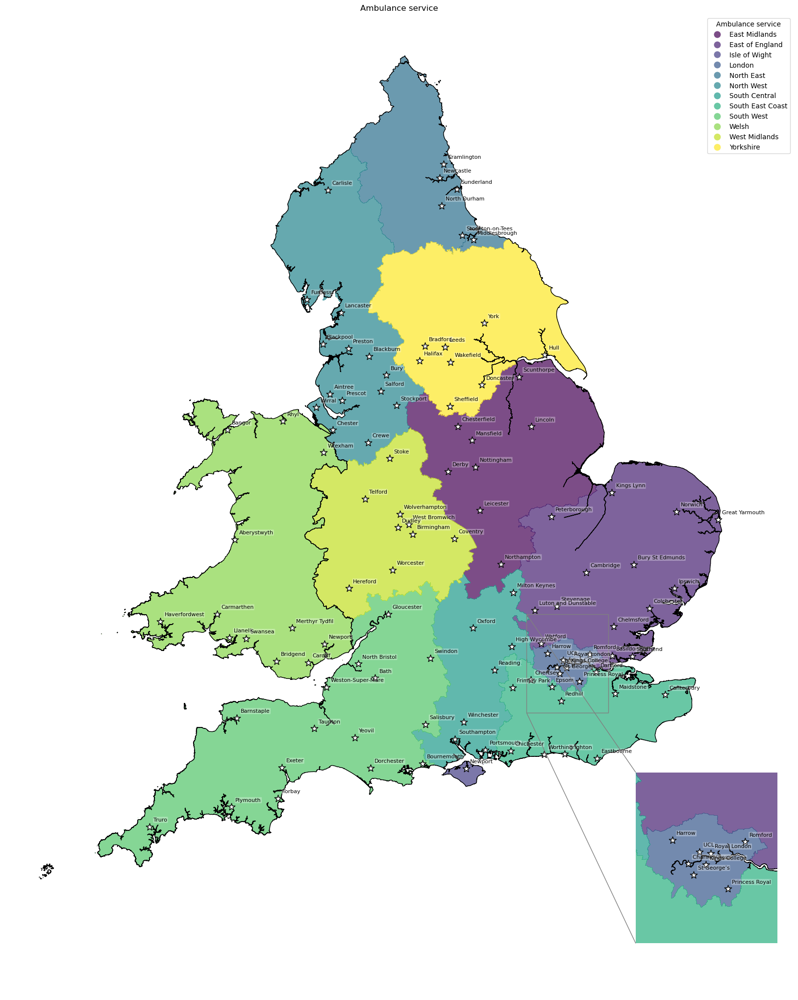

In [54]:
# Create map
create_map(
    gdf=gdf_amb_catchment,
    col='ambulance_service',
    col_readable='Ambulance service',
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='viridis')

### Population-weighted mean time to IVT unit by ambulance trust

This is the population weighted mean time to the closest unit providing thrombolysis (IVT), which may also be referred to as a hyper acute stroke service (HASU). It is population weighted as we have mean time per LSOA, so we weight by the number of individuals in each LSOA.

In [55]:
# Weight mean time to closest IVT unit by ambulance service
df_amb_ivt_time = weighted_av(
    df_lsoa, group_by='ambulance_service',
    col='closest_ivt_unit_time', new_col='ivt_time_weighted_mean')
df_amb_ivt_time.sort_values(by='ivt_time_weighted_mean')

,mean,ivt_time_weighted_mean
ambulance_service,,
London,16.379483,16.304175
North East,17.977248,17.842487
Isle of Wight,18.789888,18.605475
North West,18.845056,18.851069
West Midlands,19.284198,19.177783
Yorkshire,19.553911,19.277658
South Central,19.810180,19.808518
Welsh,20.272813,20.130240
East of England,20.745680,20.717194


In [56]:
# Add mean to geopandas dataframe
gdf_amb_catchment = (gdf_amb_catchment.join(
    df_amb_ivt_time['ivt_time_weighted_mean']))

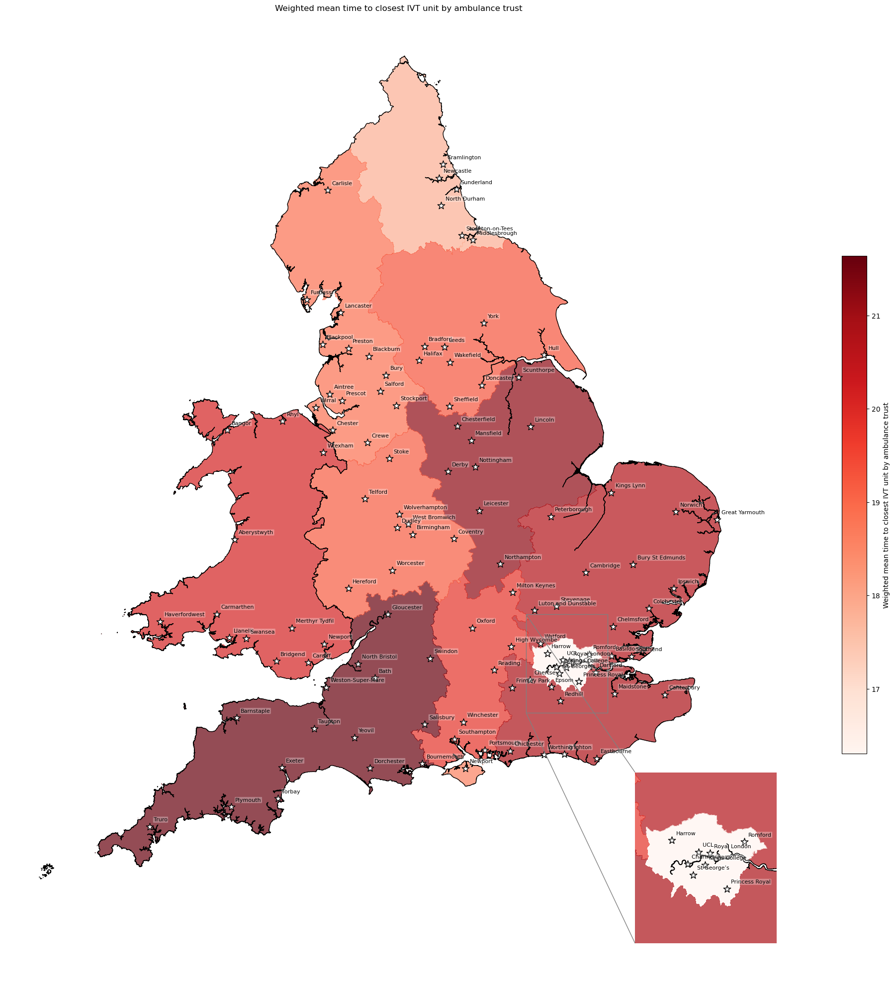

'Range: 16.304 to 21.637'

'Median: 19.543'

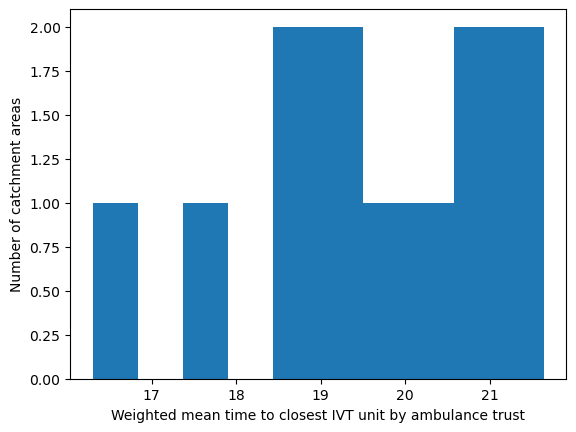

In [57]:
# Create map
create_map(
    gdf=gdf_amb_catchment.reset_index(),
    col='ivt_time_weighted_mean',
    col_readable='Weighted mean time to closest IVT unit by ambulance trust',
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Population-weighted mean time to MT unit by ambulance trust

MT unit might also be referred to as Comprehensive Stroke Centre (CSC).

This considers transfers - i.e. combines (1) time from home to closest IVT unit, and (2) transfer time to its closest MT unit (which, if the same unit, is 0)

In [58]:
# Weight mean time to thrombectomy unit by ambulance service
df_amb_mt_time = weighted_av(
    df_lsoa, group_by='ambulance_service',
    col='total_mt_time', new_col='mt_time_weighted_mean')
df_amb_mt_time.sort_values(by='mt_time_weighted_mean')

,mean,mt_time_weighted_mean
ambulance_service,,
London,25.917497,25.450542
West Midlands,37.916748,37.530963
Yorkshire,38.175378,38.060249
North West,39.155098,38.608323
North East,43.506337,43.203993
South Central,47.813957,47.961602
East Midlands,51.961945,52.201445
South East Coast,60.718024,60.631874
South West,63.863551,64.049319


In [59]:
# Add mean to geopandas dataframe
gdf_amb_catchment = (gdf_amb_catchment.join(
    df_amb_mt_time['mt_time_weighted_mean']))

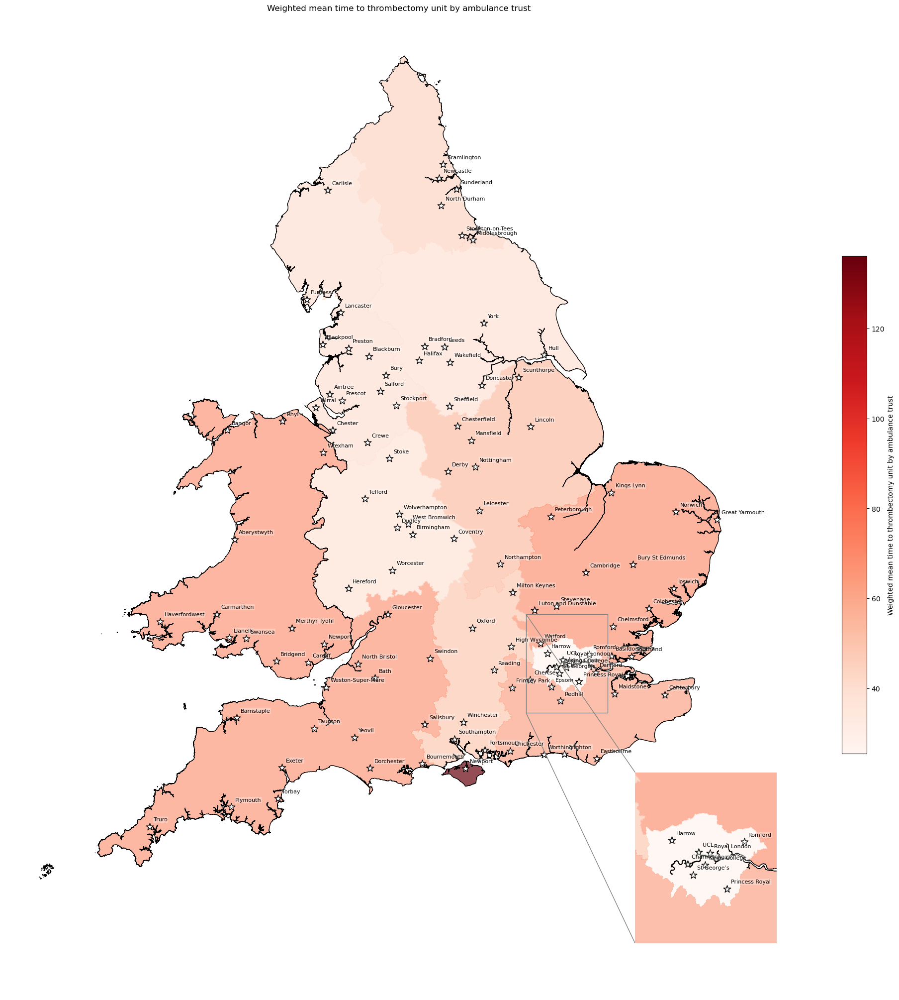

'Range: 25.451 to 136.105'

'Median: 50.082'

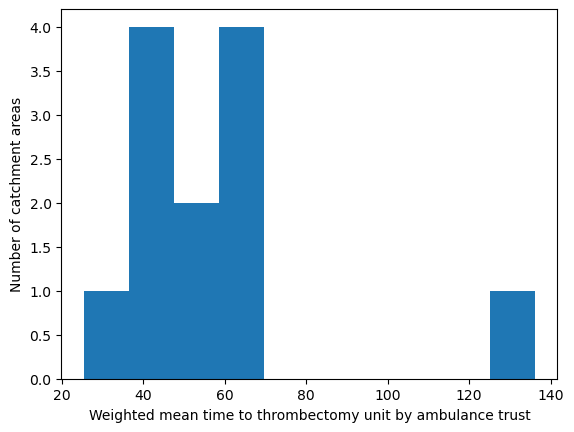

In [60]:
# Create map
create_map(
    gdf=gdf_amb_catchment.reset_index(),
    col='mt_time_weighted_mean',
    col_readable='Weighted mean time to thrombectomy unit by ambulance trust',
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Population-weighted mean transfer time between IVT and MT unit

In [61]:
# Weight mean transfer time by ambulance trust
df_amb_transfer_time = weighted_av(
    df_lsoa, group_by='ambulance_service',
    col='closest_mt_transfer_time', new_col='mt_transfer_time_weighted_mean')
df_amb_transfer_time.sort_values(by='mt_transfer_time_weighted_mean')

,mean,mt_transfer_time_weighted_mean
ambulance_service,,
London,9.538014,9.146366
West Midlands,18.632549,18.353180
Yorkshire,18.621468,18.782592
North West,20.310042,19.757255
North East,25.529089,25.361506
South Central,28.003777,28.153084
East Midlands,30.718638,30.982873
South East Coast,39.838550,39.805252
South West,42.296864,42.412750


In [62]:
# Add mean to geopandas dataframe
gdf_amb_catchment = (gdf_amb_catchment.join(
    df_amb_transfer_time['mt_transfer_time_weighted_mean']))

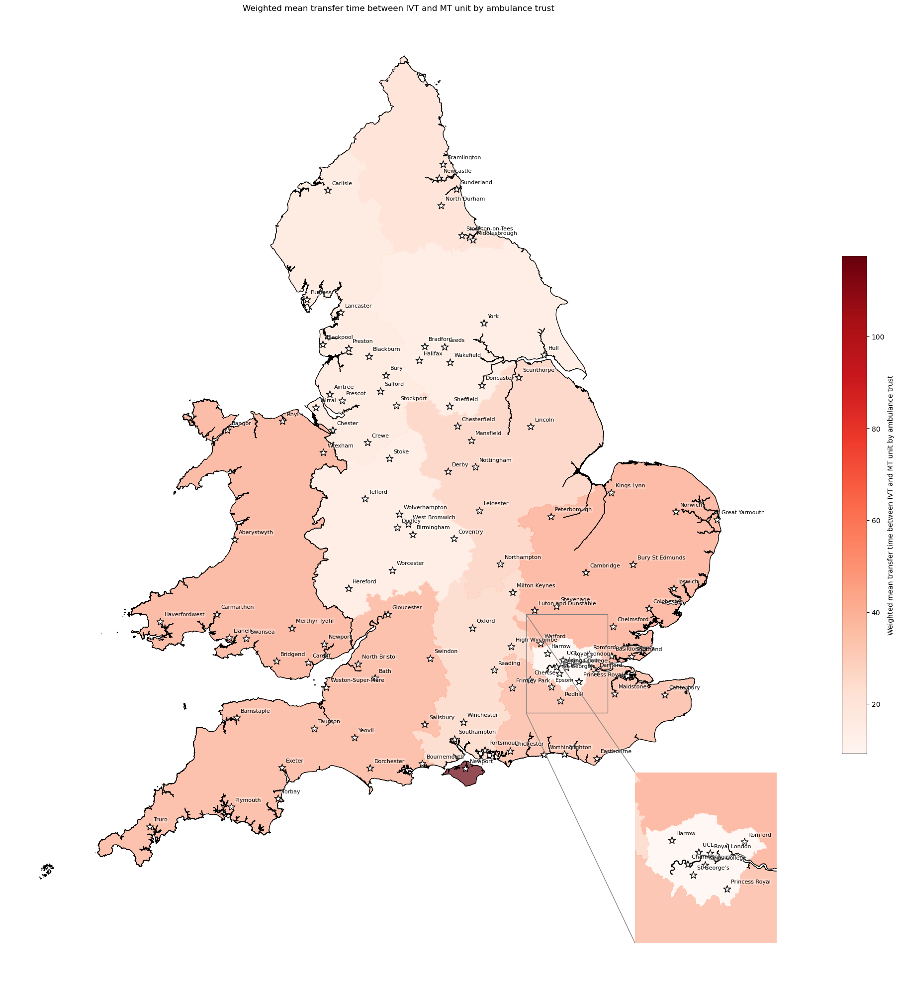

'Range: 9.146 to 117.5'

'Median: 29.568'

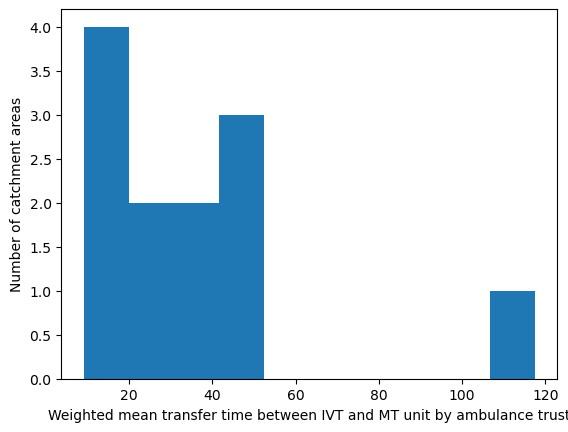

In [63]:
# Create map
create_map(
    gdf=gdf_amb_catchment.reset_index(),
    col='mt_transfer_time_weighted_mean',
    col_readable=('Weighted mean transfer time between IVT and MT unit ' +
                  'by ambulance trust'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds')

### Proportion of patients whose nearest hospital is an MT unit

In [64]:
# Add column with whether closest hospital offers thrombectomy
df_lsoa['closest_hospital_is_mt'] = (
    df_lsoa['closest_mt_transfer_time'] == 0).map({True: 'True',
                                                   False: 'False'})
df_lsoa.head()

,LSOA,admissions,closest_ivt_unit,closest_ivt_unit_time,closest_mt_unit,closest_mt_unit_time,closest_mt_transfer,closest_mt_transfer_time,total_mt_time,ivt_rate,...,age_band_males_90,ambulance_service,local_authority_district_22,LAD22NM,country,ethnic_group_not_white,long_term_health_count,ruc_overall,age_65_plus_count,closest_hospital_is_mt
0,Welwyn Hatfield 010F,0.666667,SG14AB,18.7,NW12BU,36.9,CB20QQ,39.1,57.8,6.8,...,3,East of England,Welwyn Hatfield,Welwyn Hatfield,England,279,194,Urban,212,False
1,Welwyn Hatfield 012A,4.000000,SG14AB,19.8,NW12BU,36.9,CB20QQ,39.1,58.9,6.8,...,4,East of England,Welwyn Hatfield,Welwyn Hatfield,England,388,247,Urban,203,False
2,Welwyn Hatfield 002F,2.000000,SG14AB,18.7,NW12BU,38.0,CB20QQ,39.1,57.8,6.8,...,2,East of England,Welwyn Hatfield,Welwyn Hatfield,England,224,125,Urban,193,False
3,Welwyn Hatfield 002E,0.666667,SG14AB,18.7,NW12BU,36.9,CB20QQ,39.1,57.8,6.8,...,1,East of England,Welwyn Hatfield,Welwyn Hatfield,England,332,129,Urban,156,False
4,Welwyn Hatfield 010A,3.333333,SG14AB,18.7,NW12BU,36.9,CB20QQ,39.1,57.8,6.8,...,3,East of England,Welwyn Hatfield,Welwyn Hatfield,England,200,276,Urban,256,False


In [65]:
# Find population size where closest hospital is MT v.s. not for each trust
mt_counts = (df_lsoa.groupby([
    'ambulance_service', 'closest_hospital_is_mt'])['population_all'].sum())

# Reformat dataframe
mt_counts = mt_counts.reset_index(name='population')
mt_counts = mt_counts.pivot(
    index='ambulance_service',
    columns='closest_hospital_is_mt',
    values='population').reset_index().rename_axis(None, axis=1)

# Set NaN to 0
mt_counts = mt_counts.replace(np.nan, 0)

# Find proportion true for each trust
mt_counts['proportion_closest_is_mt'] = mt_counts['True'] / (
    mt_counts['True'] + mt_counts['False'])

# Set index to ambulance service
mt_counts = mt_counts.set_index('ambulance_service')

# Show dataframe
mt_counts.sort_values(by='proportion_closest_is_mt')

,False,True,proportion_closest_is_mt
ambulance_service,,,
Isle of Wight,142296.0,0.0,0.000000
South East Coast,4910390.0,468512.0,0.087102
East of England,5433023.0,853208.0,0.135726
East Midlands,4128292.0,1018729.0,0.197926
Welsh,2532573.0,637013.0,0.200977
South West,4438820.0,1224753.0,0.216251
North East,1970544.0,710219.0,0.264932
South Central,2599012.0,1090399.0,0.295548
North West,4815907.0,2591209.0,0.349827


In [66]:
# Add proportion to geopandas dataframe
gdf_amb_catchment = (gdf_amb_catchment.join(
    mt_counts['proportion_closest_is_mt']))

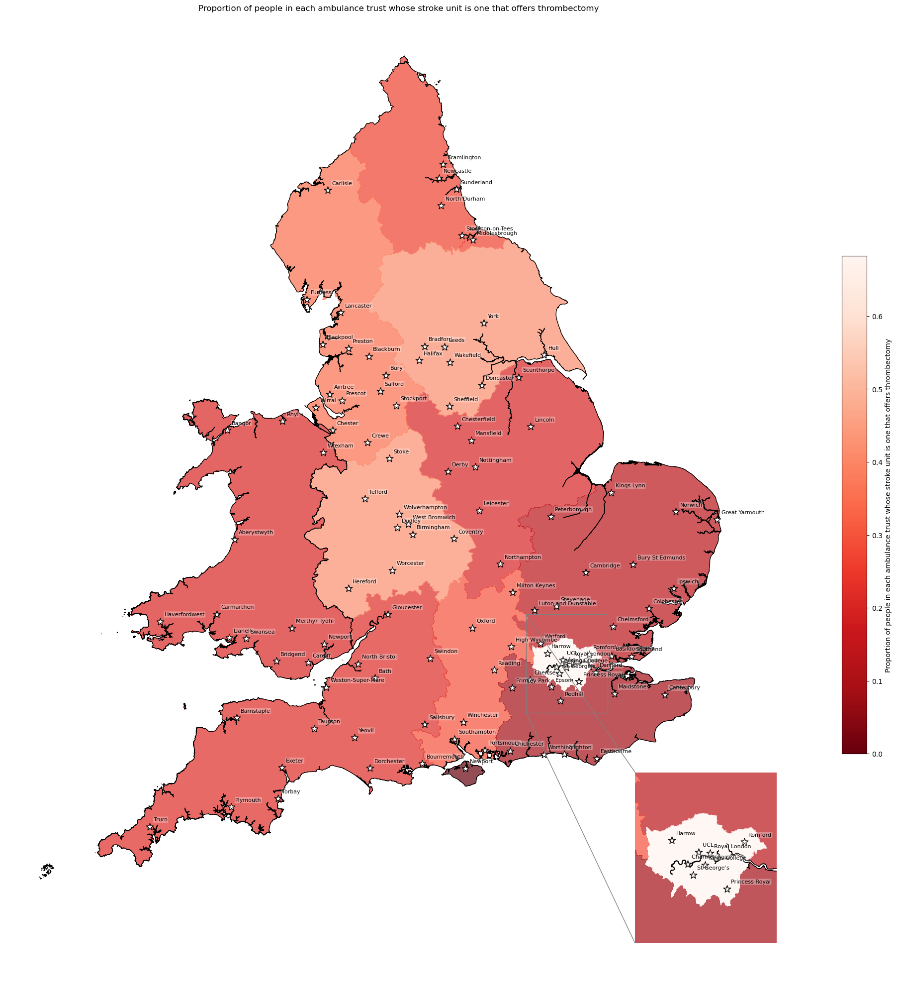

'Range: 0.0 to 0.682'

'Median: 0.241'

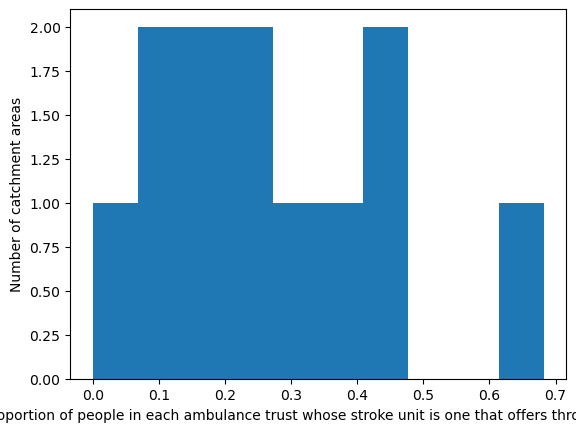

In [67]:
# Create map
create_map(
    gdf=gdf_amb_catchment.reset_index(),
    col='proportion_closest_is_mt',
    col_readable=('Proportion of people in each ambulance trust whose ' +
                  'stroke unit is one that offers thrombectomy'),
    gdf_units=gdf_units,
    base_map=False,
    show_labels=True,
    cmap='Reds_r')